In this notebook, we will demonstrate the capabilities of our model. We will show how to train the model for a specific image and also show the process of multiple runs and subsequent averaging of prediction results for greater stability and improved prediction quality.

Required imports:

In [9]:
import torch
import os
import matplotlib.pyplot as plt

from scripts.imagedata import ImageData
from scripts.neutralliner import NeutralLiner
from scripts.config import PATH_TO_MCINTOSH

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)

## Single run of the model

Here we will try to reconstruct the polarity map corresponding to Carrington rotation 1355 based on data about filaments. We will use grid-based reference points with a step size of 32. Additionally, it is worth noting that the model's functionality allows training not only on fits files but also on any single-channel images that can be interpreted as a map with filaments.

In [2]:
mapname = os.listdir(PATH_TO_MCINTOSH)[0]
num_epochs = 10000
arch = [3, 6, 12, 24, 12, 6, 3, 1]
lr = 5e-3
weight_decay = 1e-4
help_step_size = 32

We will prepare the input image using the **ImageData** class. Additionally, we will display information about the image and depict it.

width: 256
height: 512
total_pixel: 131072
bound length: 2193
percent of bound pixels: 1.7%


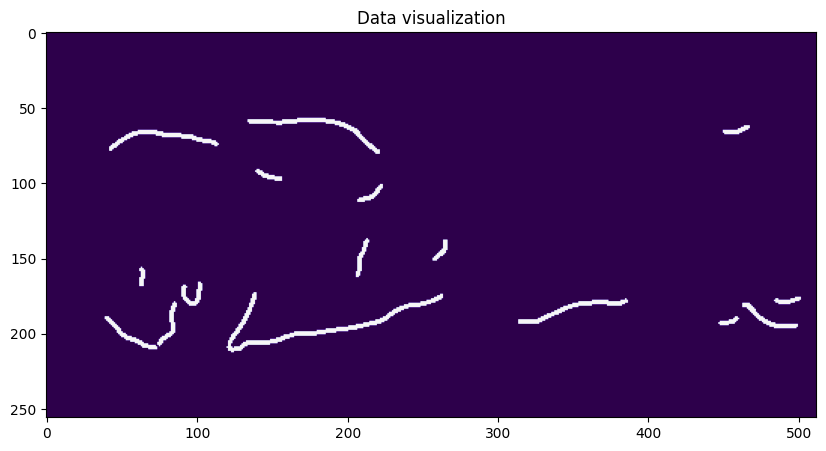

In [3]:
imgdata = ImageData(path_or_img=os.path.join(PATH_TO_MCINTOSH, mapname), data_mode='fits')
imgdata.get_info()
imgdata.show_image()

We will initialize our model and start the training. In the output window, one can observe the loss graph and its components separately.

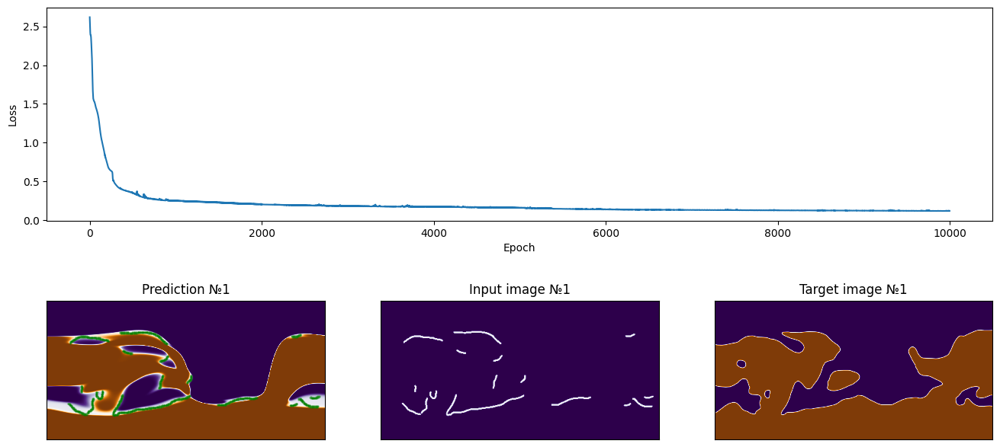

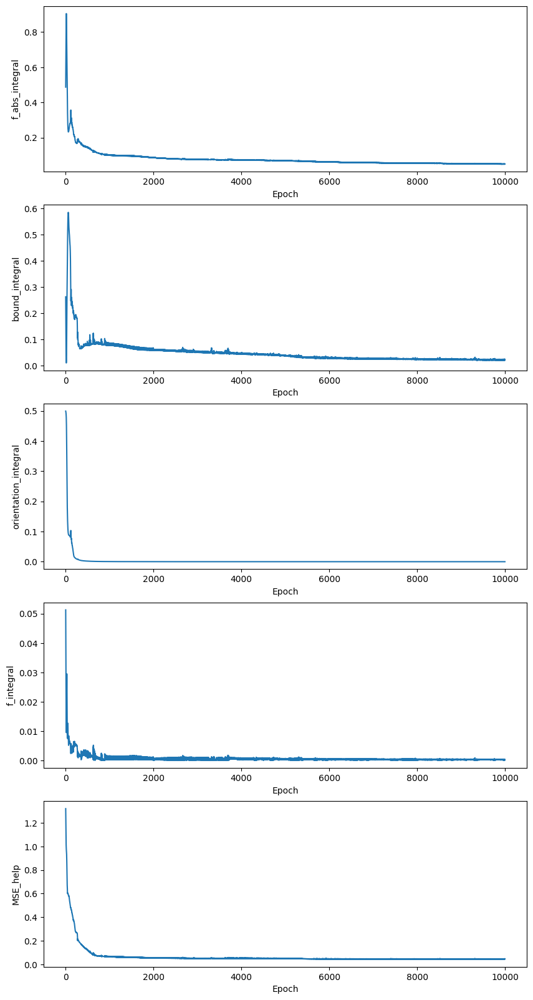

In [5]:
model = NeutralLiner(image_list=[imgdata],
                    lr=lr,
                    arch=arch,
                    mode='3d',
                    help_step_size=help_step_size,
                    weight_decay=weight_decay,
                    device=device)
model.to(device)
model.start_training(num_epochs=num_epochs, need_plot=True)

The functionality of the model allows depicting the map of the $L_2$ norm of the gradient of the constructed function $f(x, y, z)$.

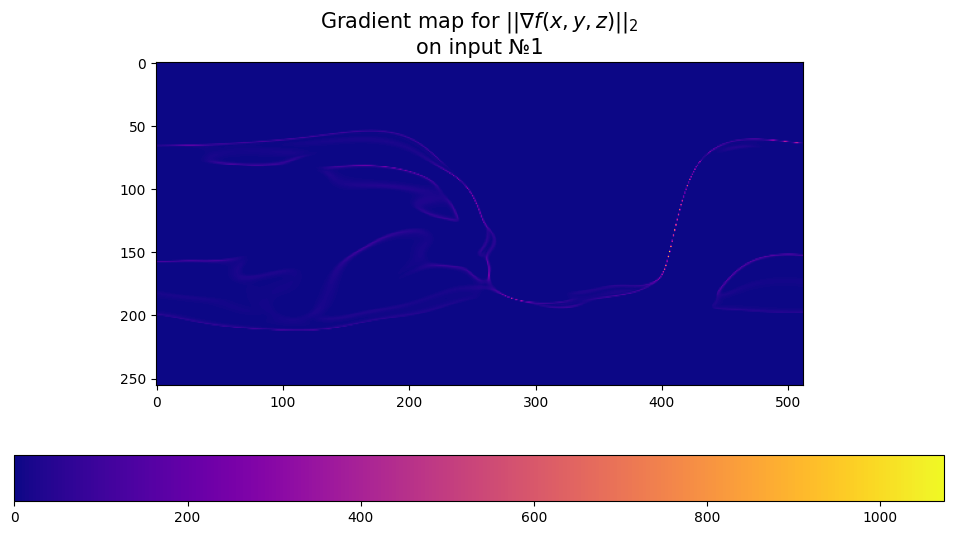

In [6]:
_ = model.compute_and_plot_gradient()

Here you can see the visualization of the function $f$ on the surface of the cylinder $\mathcal{C} \subset \mathbb{R}^3$.

In [7]:
prediction = model.test_model(need_plot=False)
model.show_3d(prediction)

# Averaging over multiple runs

Here we will train 100 independent models for the same map and average all predictions.

In [ ]:
n_runs = 100
mapname = os.listdir(PATH_TO_MCINTOSH)[0]
num_epochs = 30000
arch = [3, 6, 12, 24, 12, 6, 3, 1]
lr = 5e-3
weight_decay = 1e-4
help_step_size = 32

Text(0.5, 1.0, 'Binerized prediction')

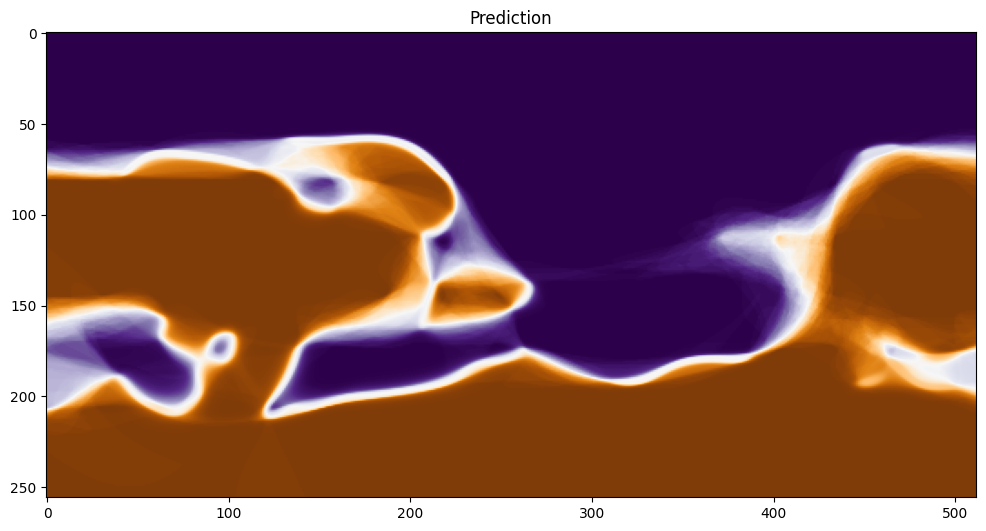

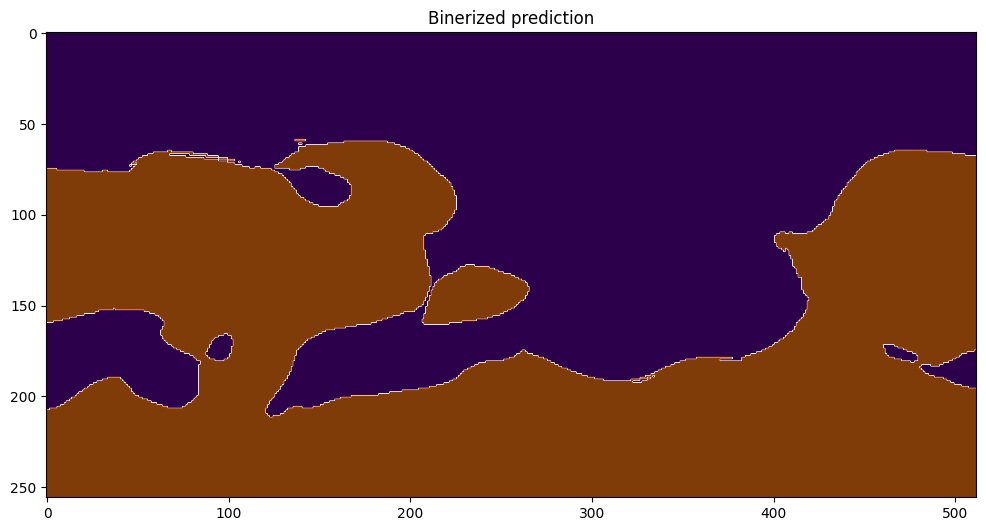

In [15]:
predictions = []

for n in range(n_runs):
    model = NeutralLiner(image_list=[imgdata],
                    lr=lr,
                    arch=arch,
                    mode='3d',
                    help_step_size=help_step_size,
                    weight_decay=weight_decay,
                    device=device)
    model.to(device)
    model.start_training(num_epochs=num_epochs, need_plot=False)
    prediction = model.test_model(need_plot=False)[0].view(model.image_list[0].img_array.shape).cpu().detach()
    predictions.append(prediction)
predictions = torch.stack(predictions)
prediction = torch.mean(predictions, dim=0)

plt.figure(figsize=(12, 10))
plt.imshow(prediction, cmap='PuOr', vmin=-1, vmax=1)
plt.title('Prediction')

plt.figure(figsize=(12, 10))
plt.imshow(prediction > 0, cmap='PuOr', vmin=0, vmax=1)
plt.title('Binerized prediction')